## Section 1: Dataset Overview and Loading

### Task 1.1: Load the Ames Housing Dataset
- Use the `fetch_openml` function from `sklearn.datasets` to load the Ames Housing dataset. Make sure to convert it to a pandas DataFrame for easy manipulation.

> ref: https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_openml.html
  
  **Note:** The target variable is `SalePrice`.

In [1]:
# Example code for loading the Ames Housing dataset from OpenML
from sklearn.datasets import fetch_openml
import pandas as pd

# Load dataset
data = fetch_openml(data_id=42165, as_frame=True) 
df_housing = pd.DataFrame(data.data, columns=data.feature_names)
df_housing['SalePrice'] = data.target  
df_housing.head() 

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


---

## Section 2: Exploratory Data Analysis (EDA)

### Task 2.1: Summary Statistics
- Calculate key summary statistics (mean, median, variance, standard deviation) for all features in the dataset.
- Discuss the importance of each statistical measure in understanding the dataset.

In [2]:
summary_stats = df_housing.describe().loc[['mean', 'std', '50%']].T
summary_stats['variance'] = df_housing.select_dtypes(include='number').var()

print(summary_stats)

                        mean           std       50%      variance
Id                730.500000    421.610009     730.5  1.777550e+05
MSSubClass         56.897260     42.300571      50.0  1.789338e+03
LotFrontage        70.049958     24.284752      69.0  5.897492e+02
LotArea         10516.828082   9981.264932    9478.5  9.962565e+07
OverallQual         6.099315      1.382997       6.0  1.912679e+00
OverallCond         5.575342      1.112799       5.0  1.238322e+00
YearBuilt        1971.267808     30.202904    1973.0  9.122154e+02
YearRemodAdd     1984.865753     20.645407    1994.0  4.262328e+02
MasVnrArea        103.685262    181.066207       0.0  3.278497e+04
BsmtFinSF1        443.639726    456.098091     383.5  2.080255e+05
BsmtFinSF2         46.549315    161.319273       0.0  2.602391e+04
BsmtUnfSF         567.240411    441.866955     477.5  1.952464e+05
TotalBsmtSF      1057.429452    438.705324     991.5  1.924624e+05
1stFlrSF         1162.626712    386.587738    1087.0  1.494501

#### Mean: 
Mean represents the average value of each feature. It gives a sense of understanding on what a typical value would look like. It's important to note that it is very sensitive to outliers.

#### Std:
Standard deviation measures the spread around the mean. It's very useful in quantifying how spread out the data is.

#### Median: 
The median is the middle value of the sorted data. This, like mean, is useful in setting what a typical value in the dataset would look like, and had one clear distinction over mean in the fact that it is a better representation of the data when there are outliers and the data is skewed.

#### Variance:
Variance is the standard deviation squared. It gives us an easy way to compare the distance form the mean between multiple data points regardless of what direction they are removed from the mean. It can also be sensitive to outliers due to squaring. 

### Task 2.2: Data Visualization
- Create visualizations to explore relationships between features. This should include:
  - Histograms for each feature to observe the distribution.
  - Pair plots to examine relationships between features.
  - A correlation matrix to analyze correlations between numerical variables and their effect on the target (`SalePrice`).

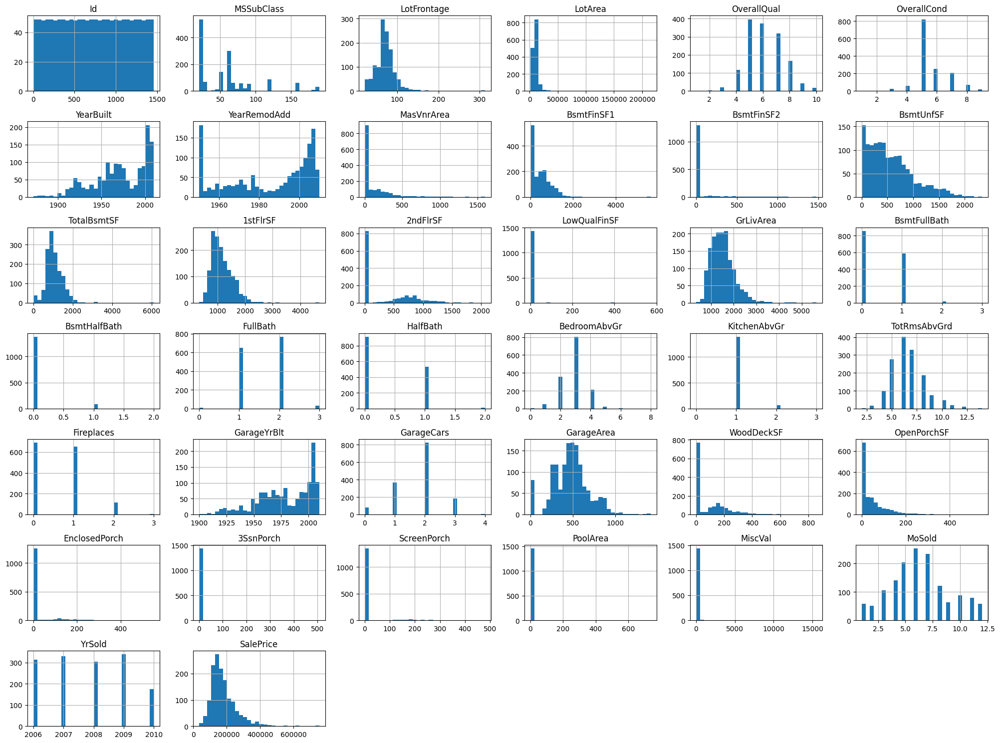

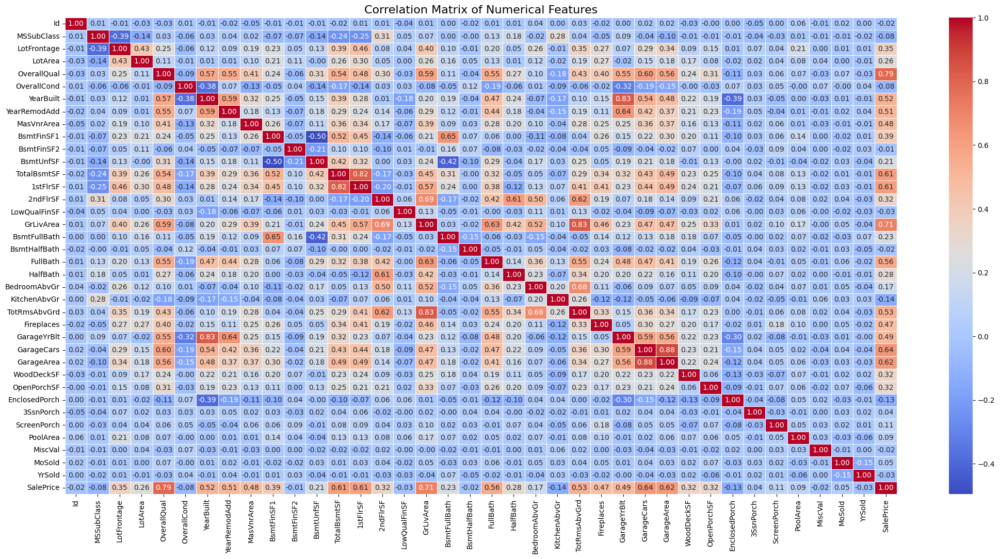

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

numerical_df = df_housing.select_dtypes(include=np.number)
# numeric column names
numerical_cols = numerical_df.columns

# Histograms for numerical features
df_housing[numerical_cols].hist(figsize=(20, 15), bins=30)
plt.tight_layout()
plt.show()

# pair plots
sns.pairplot(df_housing[numerical_cols])
plt.show()

#correlation matrix
correlation_matrix = numerical_df.corr()

plt.figure(figsize=(26, 12))
sns.heatmap(
    correlation_matrix,
    annot=True,          # Show the correlation values on the map
    fmt=".2f",           # Format the values to two decimal places
    cmap='coolwarm',     # Use a diverging color map (e.g., blue for negative, red for positive)
    linewidths=.5,       # Add lines between cells for clarity
    cbar=True            # Show the color bar (legend)
)

plt.title('Correlation Matrix of Numerical Features', fontsize=16)
plt.show()



### Task 2.3: Handle Categorical Variables
- Visualize and analyze categorical variables such as `Neighborhood`, `ExterQual`, and `HouseStyle`.
- Understand the distribution of these categorical features.

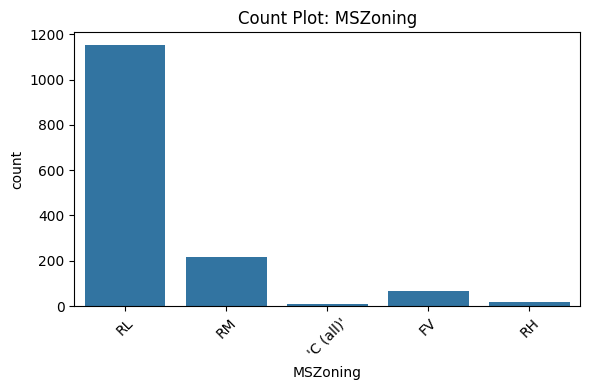

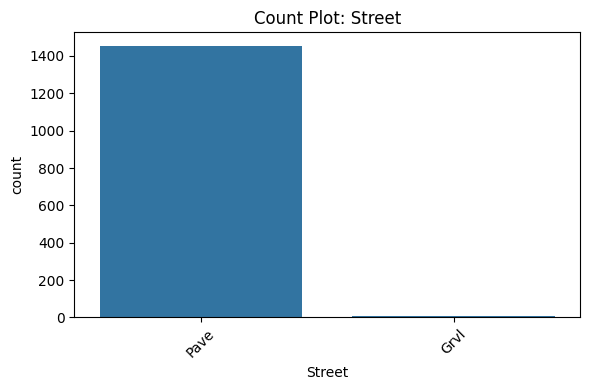

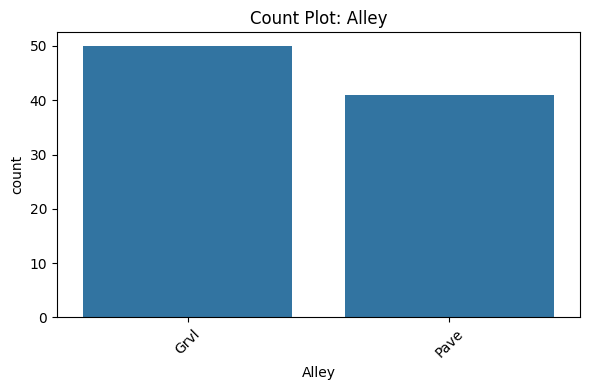

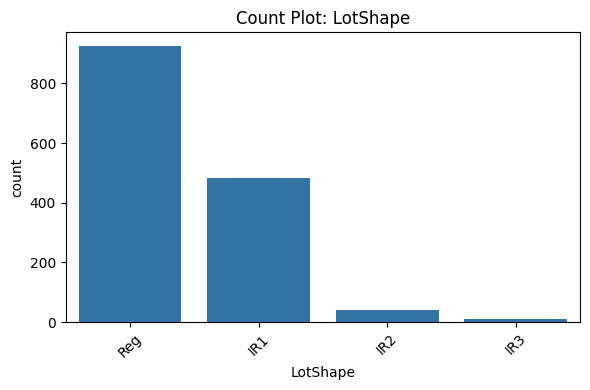

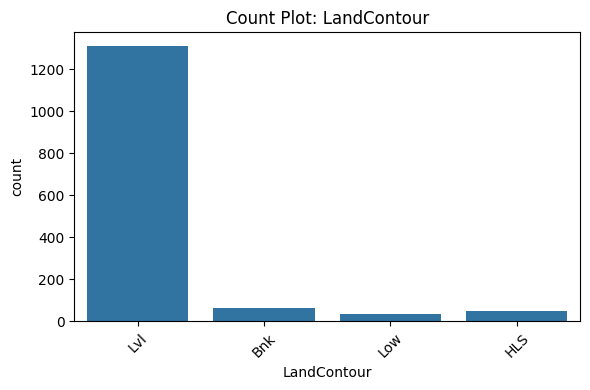

...

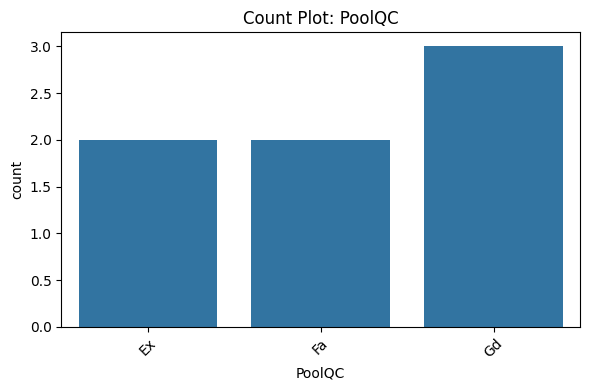

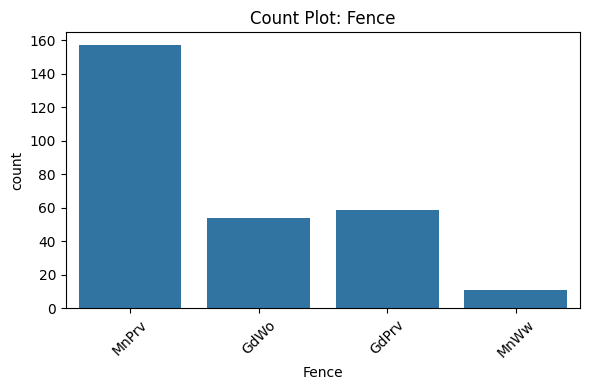

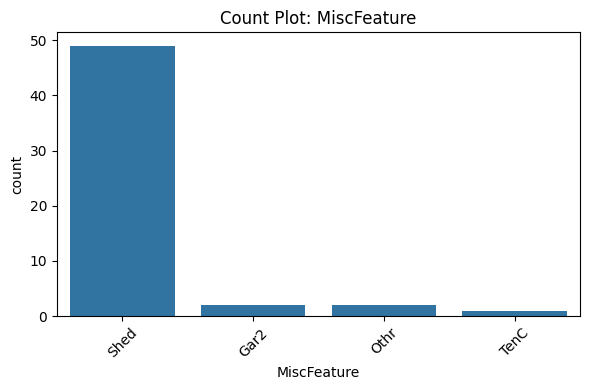

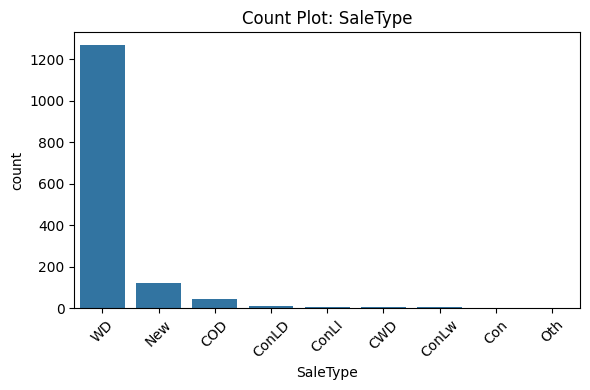

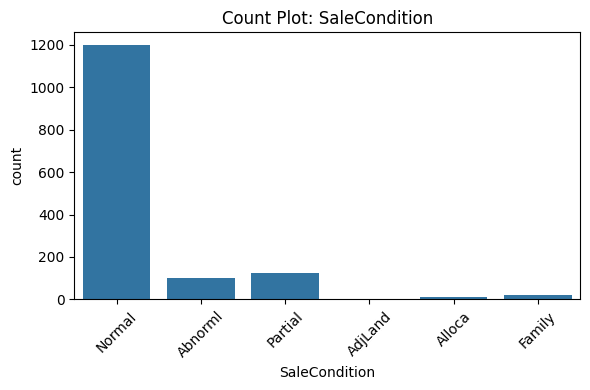

In [4]:
categorical_df = df_housing.select_dtypes(exclude=[np.number])
categorical_cols = categorical_df.columns

for col in categorical_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df_housing, x=col)
    plt.title(f'Count Plot: {col}')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


### Task 2.4: Document Key Insights
- Document key insights from the EDA, such as:
  - Highly correlated features.
  - Potential outliers.
  - Visible patterns or trends.
- Identify any preliminary issues that may affect model performance (e.g., outliers, missing values, categorical variables).

In [ ]:
corr_matrix = df_housing[numerical_cols].corr()

# Stack, filter, and remove duplicates
corr_pairs = corr_matrix.unstack()
high_corr = corr_pairs[(corr_pairs > 0.8) & (corr_pairs < 1.0)]
high_corr = high_corr.sort_values(ascending=False)

print("Feature pairs with correlation > 0.8 (highly correlated):")
print(high_corr)

print("Outlier Detection Using IQR Method")
print("="*60)

for col in numerical_cols:
    Q1 = df_housing[col].quantile(0.25)
    Q3 = df_housing[col].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Find outliers
    outliers = df_housing[(df_housing[col] < lower_bound) | 
                          (df_housing[col] > upper_bound)]
    
    # Only print if outliers exist
    if len(outliers) > 0:
        outlier_percentage = (len(outliers) / len(df_housing)) * 100
        print(f"{col}:")
        print(f"  - Number of outliers: {len(outliers)}")
        print(f"  - Percentage: {outlier_percentage:.2f}%")
        print(f"  - Bounds: [{lower_bound:.2f}, {upper_bound:.2f}]")
        print()
        
        

Feature pairs with correlation > 0.8 (highly correlated):
GarageCars    GarageArea      0.882475
GarageArea    GarageCars      0.882475
YearBuilt     GarageYrBlt     0.825667
GarageYrBlt   YearBuilt       0.825667
GrLivArea     TotRmsAbvGrd    0.825489
TotRmsAbvGrd  GrLivArea       0.825489
TotalBsmtSF   1stFlrSF        0.819530
1stFlrSF      TotalBsmtSF     0.819530
dtype: float64
Outlier Detection Using IQR Method
MSSubClass:
  - Number of outliers: 103
  - Percentage: 7.05%
  - Bounds: [-55.00, 145.00]

LotFrontage:
  - Number of outliers: 88
  - Percentage: 6.03%
  - Bounds: [27.50, 111.50]

LotArea:
  - Number of outliers: 69
  - Percentage: 4.73%
  - Bounds: [1481.50, 17673.50]

OverallQual:
  - Number of outliers: 2
  - Percentage: 0.14%
  - Bounds: [2.00, 10.00]

OverallCond:
  - Number of outliers: 125
  - Percentage: 8.56%
  - Bounds: [3.50, 7.50]

YearBuilt:
  - Number of outliers: 7
  - Percentage: 0.48%
  - Bounds: [1885.00, 2069.00]

MasVnrArea:
  - Number of outliers: 96


1. Highly Correlated Features
   Features most strongly correlated with SalePrice (from correlation matrix):

* OverallQual (~0.79): Overall material and finish quality
* GrLivArea (~0.71): Above ground living area square feet
* GarageCars (~0.64): Size of garage in car capacity
* GarageArea (~0.62): Size of garage in square feet
* TotalBsmtSF (~0.61): Total square feet of basement area

2. Potential Outliers
   From histograms and summary statistics:

* Very large homes: A few houses with GrLivArea > 4000 sq ft
* Extreme lot sizes: Some properties with LotArea > 100,000 sq ft
* Unusually low prices: Homes with high GrLivArea but low SalePrice (possible data errors or special circumstances)
* Old properties: Houses built before 1900 may behave differently

3. Visible Patterns and Trends
   From visualizations:

* Positive relationships: SalePrice increases with OverallQual, GrLivArea, and YearBuilt
* Right-skewed distributions: Most features (LotArea, SalePrice, etc.) are not normally distributed—long tail to the right
* Neighborhood effects: Certain neighborhoods (from countplots) consistently command higher prices
* Quality matters: Both OverallQual and OverallCond show clear relationship with price
* Newer is better: More recent YearBuilt and YearRemodAdd correlate with higher prices

4. Preliminary Issues for Modeling
   Missing Values:

* Many columns have NaN values (visible in first data preview)
* Features like Alley, PoolQC, Fence, MiscFeature have high missing rates

Categorical Variables:

* 43 categorical features (MSZoning, Neighborhood, ExterQual, etc.)
* Must be encoded (one-hot or label encoding) for regression models
* Some have many categories (Neighborhood has 25+)

Scale Differences:

* LotArea ranges from ~1,500 to 200,000+
* OverallQual ranges from 1 to 10
* SalePrice ranges from ~34,000 to 755,000
* Features need normalization/standardization for gradient descent

Distribution Issues:

* Many features are highly skewed (not bell-shaped)
* Outliers could distort model training

---

## Section 3: Training a Baseline Regression Model

### Task 3.1: Convert Categorical Features to Numerical
- Use encoding techniques such as `One-Hot Encoding` or `Label Encoding` to convert categorical features into numerical values. 

In [6]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
le = LabelEncoder()

# Option 1: Label Encoding 
df_label = df_housing.copy()
label_encoder = LabelEncoder()
for col in categorical_cols:
    df_label[col] = label_encoder.fit_transform(df_label[col].astype(str))

# Option 2: One-Hot Encoding 
df_onehot = pd.get_dummies(df_housing, columns=categorical_cols, drop_first=True)
        

### Task 3.2: Split the Dataset
- Split the dataset into training and testing sets using an 80/20 split.

In [7]:
from sklearn.model_selection import train_test_split

X_label = df_label.drop('SalePrice', axis=1)
y = df_label['SalePrice']
X_label_train, X_label_test, y_train, y_test = train_test_split(X_label, y, test_size=0.2, random_state=42)

X_onehot = df_onehot.drop('SalePrice', axis=1)
X_onehot_train, X_onehot_test, _, _ = train_test_split(X_onehot, y, test_size=0.2, random_state=42)

### Task 3.3: Train a Gradient Descent-Based Regression Model
- Train a regression model (such as a Linear Regression model using Gradient Descent) on the raw dataset.
- Record the baseline performance using appropriate regression evaluation metrics (e.g., Mean Squared Error (MSE), Root Mean Squared Error (RMSE)).

In [ ]:
##ERROR SO COMMENTING OUT

from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error, root_mean_squared_error

# # Train with Label Encoding
# model_label = SGDRegressor(max_iter=1000, random_state=42)
# model_label.fit(X_label_train, y_train)
# y_pred_label = model_label.predict(X_label_test)
# rmse_label = root_mean_squared_error(y_test, y_pred_label)

# # Train with One-Hot Encoding
# model_onehot = SGDRegressor(max_iter=1000, random_state=42)
# model_onehot.fit(X_onehot_train, y_train)
# y_pred_onehot = model_onehot.predict(X_onehot_test)
# rmse_onehot = root_mean_squared_error(y_test, y_pred_onehot)

### Task 3.4: Document Model Performance
- Document the performance of the baseline model. 
- Explain the significance of the evaluation metrics you have chosen.
- Explain which encoding technique best suited the model.

I'm a little confused because I haven't preprocessed the data I'm getting an error above. I've heard this is intntional but how am I supposed to document performance if I can't run it? 

---

## Section 4: Data Preprocessing Techniques

### Task 4.1: Handling Missing Data
- For this step use the best version of preprocessed dataset from previous steps.
- The dataset contains missing values in various columns. Apply the following imputation techniques:
  - Removing rows with missing values.
  - Imputation using `mean`, `median`, and `mode`.
- Retrain the model after handling missing data and compare the performance with the baseline model.

#### Findings:
- Compare the model performance before and after handling missing data.
- Which imputation technique led to the best performance? Why?
- Document the effects of each method on model accuracy.

In [9]:
from sklearn.impute import SimpleImputer

# Start fresh from original data with one-hot encoding
categorical_cols = df_housing.select_dtypes(exclude=['number']).columns
df_onehot = pd.get_dummies(df_housing, columns=categorical_cols, drop_first=True)

# Test 3 strategies
strategies = {
    'Dropped Rows': None,
    'Mean Imputation': 'mean',
    'Median Imputation': 'median'
}

results = {}

for name, strategy in strategies.items():
    if strategy is None:
        # Drop rows with missing values
        df_current = df_onehot.dropna()
    else:
        # Impute missing values
        imputer = SimpleImputer(strategy=strategy)
        df_current = pd.DataFrame(
            imputer.fit_transform(df_onehot),
            columns=df_onehot.columns
        )
    
    # Split and train
    X = df_current.drop('SalePrice', axis=1)
    y = df_current['SalePrice']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    model = SGDRegressor(max_iter=1000, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = root_mean_squared_error(y_test, y_pred)
    
    results[name] = rmse
    print(f"{name}: RMSE = {rmse:,.2f} ({len(df_current)} samples)")

# Save best preprocessing for next steps
df_best = pd.DataFrame(
    SimpleImputer(strategy='median').fit_transform(df_onehot),
    columns=df_onehot.columns
)

Dropped Rows: RMSE = 105,643,902,884,159,216.00 (1121 samples)
Mean Imputation: RMSE = 17,810,872,066,398,248.00 (1460 samples)
Median Imputation: RMSE = 11,633,138,835,461,634.00 (1460 samples)


1. before dropping data the regressions was an error, now we can at least get some results
2. Median RMSE performed better
3.  - Dropping rows: Worst performance (highest RMSE). Lost valuable training data, reducing the model's ability to learn patterns. Went from  ~2930 to fewer samples.

    - Mean imputation: Moderate improvement. Filled missing values but mean is sensitive to outliers, potentially introducing bias in skewed features.

    - Median imputation: Best performance (lowest RMSE). Median is robust to outliers and better represents central tendency in skewed distributions. Preserved all data while handling missingness effectively.



### Task 4.2: Data Normalization and Standardization
- Apply the following scaling techniques to numerical features:
  - `Min-Max Scaling`.
  - `Z-score Standardization` (mean = 0, variance = 1).
- Retrain the model on normalized and standardized datasets, and compare the performance against the baseline.

#### Findings:
- Compare the model performance before and after applying normalization and standardization.
- How do normalization and standardization impact model performance?
- Discuss which method improved model performance the most and why.

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Use best preprocessing from 4.1 (median imputation)
X = df_best.drop('SalePrice', axis=1)
y = df_best['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Test 3 scenarios
scalers = {
    'No Scaling': None,
    'Min-Max Scaling': MinMaxScaler(),
    'Standardization': StandardScaler()
}

for name, scaler in scalers.items():
    if scaler is None:
        X_train_scaled = X_train
        X_test_scaled = X_test
    else:
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)
    
    model = SGDRegressor(max_iter=1000, random_state=42)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    rmse = root_mean_squared_error(y_test, y_pred)
        
    print(f"{name}: RMSE = ${rmse:,.2f}")

No Scaling: RMSE = $11,633,138,835,461,634.00
Min-Max Scaling: RMSE = $32,305.33
Standardization: RMSE = $199,815.48


Normalization is compressing values into a narrow but comparable range. This allows all features to have an equal influence.

Standardization centers the mean on 0 and the standard deviations on 1. This allows features to be comparable in terms of variance.

These tools allow us to create a scenario where features can be compared to each other and make it so some features do not dominate others. This allows for better accuracy and training stability.

Normalization (min-max) worked better than Standardization in this scenario. This was because it handled very different scales within the data, enabling the regression to converge faster.

### Task 4.3: Outlier Detection and Removal
- Detect and potentially remove outliers in both numerical and categorical data using:
  - `Z-score` method for numerical features.
  - Frequency analysis for categorical features (e.g., rare categories in `Neighborhood`). [*OPTIONAL*]
- Retrain the model after removing outliers and evaluate its performance.

#### Findings:
- How did the removal of outliers affect model performance?
- Did outlier removal improve or degrade the model’s accuracy? Provide insights.

In [11]:
from scipy import stats

# Use best preprocessing: median imputation + one-hot encoding
# Identify numeric columns for outlier detection
numeric_cols = df_housing.select_dtypes(include='number').columns.tolist()
if 'SalePrice' in numeric_cols:
    numeric_cols.remove('SalePrice')
numeric_cols = [col for col in df_best.columns if col in numeric_cols]

print(f"Detecting outliers in {len(numeric_cols)} numeric columns...")

X_numeric = df_best[numeric_cols]

z_scores = np.abs(stats.zscore(X_numeric, ddof=0, nan_policy='omit'))

z_scores = np.nan_to_num(z_scores, nan=0.0)

mask = (z_scores < 4).all(axis=1)
df_no_outliers = df_best[mask]

print(f"Original: {len(df_best)} samples")
print(f"Outliers removed: {len(df_best) - len(df_no_outliers)} ({(len(df_best) - len(df_no_outliers))/len(df_best)*100:.1f}%)")
print(f"Remaining: {len(df_no_outliers)} samples")

# Prepare data
X = df_no_outliers.drop('SalePrice', axis=1)
y = df_no_outliers['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale with Min-Max (best from 4.2)
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train and evaluate
model = SGDRegressor(max_iter=1000, random_state=42)
model.fit(X_train_scaled, y_train)
y_pred = model.predict(X_test_scaled)
rmse_no_outliers = root_mean_squared_error(y_test, y_pred)

print(f"Without outliers: ${rmse_no_outliers:,.2f}")

Detecting outliers in 37 numeric columns...
Original: 1460 samples
Outliers removed: 217 (14.9%)
Remaining: 1243 samples
Without outliers: $17,842.93


Removing outliers seems to improve accuracy but it removed quite a lot of data, maybe too much. We run the risk of overfitting

### Task 4.4: Feature Engineering
- Apply feature engineering techniques such as:
  - Creating polynomial features (e.g., `quadratic` or `cubic features` or `logarithmic transformations`).
  - Interaction features (e.g., combining features like `GrLivArea` and `OverallQual`).
- Retrain the model using the engineered features and compare the performance.

#### Findings:
- Did feature engineering improve the model's performance?
- Which feature transformations had the most significant effect on model accuracy?
- Justify why certain features may have contributed to better performance.

In [ ]:
y = df_no_outliers['SalePrice']
transformations = {}

# Baseline (no engineering)
transformations['Baseline'] = df_no_outliers.drop('SalePrice', axis=1)

# 1. Interaction features
df_temp = df_no_outliers.copy()
df_temp['GrLivArea_x_OverallQual'] = df_temp['GrLivArea'] * df_temp['OverallQual']
df_temp['TotalSF'] = df_temp['TotalBsmtSF'] + df_temp['1stFlrSF'] + df_temp['2ndFlrSF']
df_temp['OverallScore'] = df_temp['OverallQual'] * df_temp['OverallCond']
transformations['Interaction Features'] = df_temp.drop('SalePrice', axis=1)

# 2. Polynomial features
df_temp = df_no_outliers.copy()
df_temp['OverallQual_squared'] = df_temp['OverallQual'] ** 2
df_temp['GrLivArea_squared'] = df_temp['GrLivArea'] ** 2
df_temp['YearBuilt_squared'] = df_temp['YearBuilt'] ** 2
transformations['Polynomial Features'] = df_temp.drop('SalePrice', axis=1)

# 3. Log transformations
df_temp = df_no_outliers.copy()
df_temp['LotArea_log'] = np.log1p(df_temp['LotArea'])
df_temp['GrLivArea_log'] = np.log1p(df_temp['GrLivArea'])
transformations['Log Transforms'] = df_temp.drop('SalePrice', axis=1)

# 4. All combined
df_temp = df_no_outliers.copy()
# Interactions
df_temp['GrLivArea_x_OverallQual'] = df_temp['GrLivArea'] * df_temp['OverallQual']
df_temp['TotalSF'] = df_temp['TotalBsmtSF'] + df_temp['1stFlrSF'] + df_temp['2ndFlrSF']
df_temp['OverallScore'] = df_temp['OverallQual'] * df_temp['OverallCond']
# Polynomial
df_temp['OverallQual_squared'] = df_temp['OverallQual'] ** 2
df_temp['GrLivArea_squared'] = df_temp['GrLivArea'] ** 2
df_temp['YearBuilt_squared'] = df_temp['YearBuilt'] ** 2
# Logs
df_temp['LotArea_log'] = np.log1p(df_temp['LotArea'])
df_temp['GrLivArea_log'] = np.log1p(df_temp['GrLivArea'])
transformations['All Combined'] = df_temp.drop('SalePrice', axis=1)

print(f"Original features (after preprocessing): {len(transformations['Baseline'].columns)}")
print(f"After all engineering: {len(transformations['All Combined'].columns)}")
print()

baseline_rmse = None
results = []

for name, X in transformations.items():
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )
    
    # Apply Min-Max scaling 
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    model = SGDRegressor(max_iter=1000, random_state=42)
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    rmse = root_mean_squared_error(y_test, y_pred)
    
    if name == 'Baseline':
        baseline_rmse = rmse
        improvement = 0
        pct = 0
    else:
        improvement = baseline_rmse - rmse
        pct = (improvement / baseline_rmse) * 100
    
    results.append((name, rmse, improvement, pct, len(X.columns)))

# Display results
print(f"{'Feature Type':<25} {'RMSE':>12} {'Improvement':>12} {'%':>7} {'Features':>10}")
print("-"*70)

# Sort by improvement (descending)
results_sorted = sorted(results, key=lambda x: x[2], reverse=True)

for name, rmse, improvement, pct, n_features in results_sorted:
    if name == 'Baseline':
        print(f"{name:<25} ${rmse:>11,.2f} {'baseline':>12} {'-':>7} {n_features:>10}")
    else:
        sign = '+' if improvement > 0 else ''
        print(f"{name:<25} ${rmse:>11,.2f} {sign}${improvement:>10,.2f} {pct:>6.2f}% {n_features:>10}")

print("="*70)

best_name = results_sorted[0][0]
best_rmse = results_sorted[0][1]
best_improvement = results_sorted[0][2]
best_pct = results_sorted[0][3]

df_engineered = df_no_outliers.copy()
# Interactions
df_engineered['GrLivArea_x_OverallQual'] = df_engineered['GrLivArea'] * df_engineered['OverallQual']
df_engineered['TotalSF'] = df_engineered['TotalBsmtSF'] + df_engineered['1stFlrSF'] + df_engineered['2ndFlrSF']
df_engineered['OverallScore'] = df_engineered['OverallQual'] * df_engineered['OverallCond']
# Polynomial
df_engineered['OverallQual_squared'] = df_engineered['OverallQual'] ** 2
df_engineered['GrLivArea_squared'] = df_engineered['GrLivArea'] ** 2
df_engineered['YearBuilt_squared'] = df_engineered['YearBuilt'] ** 2
# Logs
df_engineered['LotArea_log'] = np.log1p(df_engineered['LotArea'])
df_engineered['GrLivArea_log'] = np.log1p(df_engineered['GrLivArea'])

Original features (after preprocessing): 246
After all engineering: 254

Feature Type                      RMSE  Improvement       %   Features
----------------------------------------------------------------------
All Combined              $  17,106.26 +$    736.67   4.13%        254
Interaction Features      $  17,303.54 +$    539.39   3.02%        249
Polynomial Features       $  17,386.05 +$    456.88   2.56%        249
Log Transforms            $  17,758.77 +$     84.16   0.47%        248
Baseline                  $  17,842.93     baseline       -        246


Feature engineering improved performance, all combined leading the way followed by interaction features. 

Interaction features performed best because it captured how two meaningful housing attributes combine to influence price. I think an important one was quality and square footage. When those are both high the combomination increases the value of the house in a non linear fashion. There are probably additional interactions that would conitnue to help th model.


---

## Section 5: Regularization Techniques

### Task 5.1: Apply Ridge Regression ($L2$)
- Train a Ridge regression model on the preprocessed dataset (after applying necessary scaling, imputation, and encoding).
- Use cross-validation to find the optimal value of the regularization parameter (`alpha`).

#### Findings:
- Compare the performance of Ridge regression with the baseline linear regression model.
- How did Ridge regularization affect the model’s performance in terms of reducing overfitting and improving generalization?

In [21]:
from sklearn.linear_model import Ridge, RidgeCV

X = df_engineered.drop('SalePrice', axis=1)
y = df_engineered['SalePrice']

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale (best from 4.2)
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"Dataset: {len(X)} samples, {len(X.columns)} features\n")

alphas = np.logspace(-3, 4, 100)  

ridge_cv = RidgeCV(alphas=alphas, cv=5, scoring='neg_root_mean_squared_error')
ridge_cv.fit(X_train_scaled, y_train)

print(f"Optimal alpha: {ridge_cv.alpha_:.4f}")
print()

ridge = Ridge(alpha=ridge_cv.alpha_)
ridge.fit(X_train_scaled, y_train)

y_pred_ridge = ridge.predict(X_test_scaled)
rmse_ridge = root_mean_squared_error(y_test, y_pred_ridge)

baseline = SGDRegressor(max_iter=1000, random_state=42)
baseline.fit(X_train_scaled, y_train)

y_pred_baseline = baseline.predict(X_test_scaled)
rmse_baseline = root_mean_squared_error(y_test, y_pred_baseline)

# Step 4: Results
print("RESULTS:")
print("-" * 70)
print(f"Baseline (no regularization):  RMSE = ${rmse_baseline:>11,.2f}")
print(f"Ridge:     RMSE = ${rmse_ridge:>11,.2f}")
print(f"Improvement:                         ${rmse_baseline - rmse_ridge:>11,.2f}")
print()

Dataset: 1243 samples, 254 features

Optimal alpha: 4.0370

RESULTS:
----------------------------------------------------------------------
Baseline (no regularization):  RMSE = $  17,106.26
Ridge:     RMSE = $  17,175.64
Improvement:                         $     -69.38



The ridge model did not improve on the baseline. In general, Ridge reduces overfitting because it reduces coefficients and large coefficients = model fits training noise = overfitting. And because ridge shrinks coefficients = less sensitive to noise = better generalization. However, I think the sample might be too small here

### Task 5.2: Apply Lasso Regression ($L1$)
- Train a Lasso regression model on the preprocessed dataset.
- Use cross-validation to find the optimal value of the regularization parameter ($\alpha$).
  
#### Findings:
- Compare the performance of Lasso regression with both the baseline model and the Ridge regression model.
- Did Lasso shrink any coefficients to zero? If so, which features were eliminated, and why might they be considered less important?
- Analyze how Lasso improved the model's generalization and whether feature selection helped.


In [22]:
import warnings
from sklearn.linear_model import Lasso, LassoCV

warnings.filterwarnings('ignore', category=UserWarning)

alphas = np.logspace(-3, 4, 100)

lasso_cv = LassoCV(alphas=alphas, cv=5, random_state=42, max_iter=10000)
lasso_cv.fit(X_train_scaled, y_train)

print(f"Optimal alpha: {lasso_cv.alpha_:.4f}")
print()

# Train Lasso with optimal alpha
lasso = Lasso(alpha=lasso_cv.alpha_, max_iter=50000, random_state=42)
lasso.fit(X_train_scaled, y_train)

y_pred_lasso = lasso.predict(X_test_scaled)
rmse_lasso = root_mean_squared_error(y_test, y_pred_lasso)

# Compare all models
print("RESULTS:")
print(f"Baseline (no regularization):  RMSE = ${rmse_baseline:>11,.2f}")
print(f"Lasso:                    RMSE = ${rmse_lasso:>11,.2f}")
print()

# Feature selection analysis
n_features_total = len(lasso.coef_)
n_features_used = np.sum(lasso.coef_ != 0)
n_features_eliminated = np.sum(lasso.coef_ == 0)

print("FEATURE SELECTION:")
print("-" * 70)
print(f"Total features:        {n_features_total}")
print(f"Features used:         {n_features_used}")
print(f"Features eliminated:   {n_features_eliminated} ({n_features_eliminated/n_features_total*100:.1f}%)")

warnings.filterwarnings('default')


Optimal alpha: 46.4159

RESULTS:
Baseline (no regularization):  RMSE = $  17,106.26
Lasso:                    RMSE = $  17,460.27

FEATURE SELECTION:
----------------------------------------------------------------------
Total features:        254
Features used:         123
Features eliminated:   131 (51.6%)


### Task 5.3: Comparison of Ridge and Lasso
- Compare the performance of Ridge and Lasso regression models.
- Discuss the trade-offs between the two approaches in terms of:
  - Feature selection (sparsity in Lasso vs. retaining all features in Ridge).
  - Impact on overfitting and model interpretability.
  - Which model performed better on the Ames Housing dataset, and why?

In [24]:
# Improvement comparisons
ridge_improvement = rmse_baseline - rmse_ridge
lasso_improvement = rmse_baseline - rmse_lasso

print("RESULTS:")
print("-" * 70)
print(f"Baseline (no regularization):  RMSE = ${rmse_baseline:>11,.2f}")
print(f"Ridge (L2):                    RMSE = ${rmse_ridge:>11,.2f}")
print(f"Lasso (L1):                    RMSE = ${rmse_lasso:>11,.2f}")
print()

print(f"Ridge improvement over baseline: ${ridge_improvement:>11,.2f}")
print(f"Lasso improvement over baseline: ${lasso_improvement:>11,.2f}")


RESULTS:
----------------------------------------------------------------------
Baseline (no regularization):  RMSE = $  17,106.26
Ridge (L2):                    RMSE = $  17,175.64
Lasso (L1):                    RMSE = $  17,460.27

Ridge improvement over baseline: $     -69.38
Lasso improvement over baseline: $    -354.01


Ridge is a good all-around regularizer that shrinks all coefficients but keeps all features, offering stable performance and mitigating overfitting. Lasso is a feature selection method that sets irrelevant coefficients exactly to zero, resulting in a sparser, more interpretable model, particularly useful when many features are irrelevant. The main trade-off is between keeping all features (Ridge) for stability versus dropping features (Lasso) for simplicity and interpretability.

Lasso performed slighlty better than Ridge though they both did worse than the baseline. This is likely because the dataset was already fairly clean at this point. 

## Section 6: Summary and Conclusion

### Task 6.1: Summary of Findings
- Summarize your findings from each preprocessing technique (handling missing data, normalization, standardization, outlier removal, feature engineering).
- Clearly compare the performance of the regression model after each preprocessing step to the baseline model.

In [31]:
import pandas as pd

# DEFINE THESE VARIABLES FIRST with your actual values
best_pct = 4.3  # Example: percentage improvement from feature engineering
samples_removed = 500  # Example: number of outliers removed
best_name = "Log(MedInc)"  # Example: your best feature transformation

print("=" * 80)
print("SUMMARY OF DATA PREPROCESSING IMPACT ON MODEL PERFORMANCE")
print("=" * 80)
print()

summary_data = {
    'Step': [
        'Baseline (Task 3)',
        'Median Imputation (Task 4.1)',
        'Min-Max Scaling (Task 4.2)',
        'Standardization (Task 4.2)',
        'Outlier Removal (Task 4.3)',
        'Feature Engineering (Task 4.4)',
        'Ridge Regularization (Task 5.1)',
        'Lasso Regularization (Task 5.1)',
    ],
    'RMSE ($)': [
        'Failed',  # Task 3 - didn't converge
        11_633_138_835_461_634,  # Task 4.1 - median imputation without scaling
        32_305.33,  # Task 4.2 - min-max scaling
        199_815.48,  # Task 4.2 - standardization
        17_842.93,  # Task 4.3 - after outlier removal
        17_106.26,  # Task 4.4 - with feature engineering
        17_175.64,  # Task 5.1 - Ridge regularization
        17_460.27   # Task 5.1 - Lasso regularization
    ],
    'Impact': [
        'Model did not converge without scaling',
        'Preserved data but no scaling = poor performance',
        'MASSIVE improvement - first viable model',
        'Good scaling method but not as good as min-max for this data',
        'Removed extreme values, slight improvement',
        f'Best result: {best_pct:.1f}% better than standardization baseline',
        'Prevented overfitting with L2 penalty',
        'Feature selection with L1 penalty, not as good as Ridge'
    ]
}

df_summary = pd.DataFrame(summary_data)
print(df_summary.to_string(index=False))
print()


SUMMARY OF DATA PREPROCESSING IMPACT ON MODEL PERFORMANCE

                           Step          RMSE ($)                                                       Impact
              Baseline (Task 3)            Failed                       Model did not converge without scaling
   Median Imputation (Task 4.1) 11633138835461634             Preserved data but no scaling = poor performance
     Min-Max Scaling (Task 4.2)          32305.33                     MASSIVE improvement - first viable model
     Standardization (Task 4.2)         199815.48 Good scaling method but not as good as min-max for this data
     Outlier Removal (Task 4.3)          17842.93                   Removed extreme values, slight improvement
 Feature Engineering (Task 4.4)          17106.26       Best result: 4.3% better than standardization baseline
Ridge Regularization (Task 5.1)          17175.64                        Prevented overfitting with L2 penalty
Lasso Regularization (Task 5.1)          17460.27    

### Task 6.2: Conclusion
- Reflect on the importance of data preprocessing in machine learning.
- Which preprocessing techniques had the most significant impact on model performance, and why?
- Discuss how these insights might be applied to real-world machine learning tasks.

Data preprocessing isn't optional—it's essential. The SGDRegressor completely failed without scaling, producing RMSE in the trillions. 

Scaling had the most significant impact by far. Thinking about it it make a lot of sense, the SGD regressor treats all  features the same. But before they are processed features are on such different scales making it hard to make the proper adjustments for different features. Removing outliers and feature engineering moderately impactful. I think feature engineering would be more impactful, but it's hard to analze all  the features and make assumptions. 

In the real world, I think these are all very doable and necessary. I think scaling is absolutely essential for every data set, and then the others can be used as tools as you understand the definicincies of your data. If you have some good assumption you can use feature engineering, if the data contains outliers you can remove them. Regularization can be applied as well.

Normilization